<a href="https://www.kaggle.com/code/aayushsin7a/ml-obesity-or-cvd-risk?scriptVersionId=164551477" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<p style="font-family:Garamond;color:#39342F;font-size:16px">Created by: Aayush Sinha</p>
<p style="font-family:Garamond;color:#39342F;font-size:16px">Project: Playground Series - Season 4, Episode 2</p>
<p style="font-family:Garamond;color:#39342F;font-size:16px">Date: 27/02/2024</p>

# <center><span style="color: dodgerblue"> Multi-Class Prediction of Obesity Risk

#### <p style="font-family:Garamond;color:#40A2D8;font-size:16px"><center> by: Aayush Sinha </center></p>
    
***

# <center><span style="color: dodgerblue">Table of Contents

***
    
* [Introduction](#1)
* [Load Data](#2)
* [First look at the data](#3)
* [Data Wrangling](#4)
* [Exploratory Data Analysis](#5)
* [Feature Selections](#6)
* [Pipeline](#7)
* [Machine Learning](#8)
* [Feature Importance](#9)
* [Voting Classifier](#10)
* [Submission](#11)   

# <center style="color:#8D7B68"><a id = 1>Introduction
***

Our goal is to analyze the data and predict risk of obesity in individuals, therefore...

#### What are the factors that contribute to obesity risk in individuals, which is related to cardiovascular disease?

## <p style="color:#8D7B68"><a id = 1>About Dataset
    
The data consist of the estimation of obesity levels in people from the countries of Mexico, Peru and Colombia, with ages between 14 and 61 and diverse eating habits and physical condition , data was collected using a web platform with a survey where anonymous users answered each question, then the information was processed obtaining 17 attributes and 2111 records.
    
The attributes related with eating habits are: 

* Frequent consumption of high caloric food (FAVC)
* Frequency of consumption of vegetables (FCVC)
* Number of main meals (NCP)
* Consumption of food between meals (CAEC)
* Consumption of water daily (CH20)
* Consumption of alcohol (CALC)
    
The attributes related with the physical condition are: 
* Calories consumption monitoring (SCC)
* Physical activity frequency (FAF)
* Time using technology devices (TUE)
* Transportation used (MTRANS)
    
Variables obtained :
* Gender
* Age
* Height
* Weight

NObesity values are:

* Underweight Less than 18.5
* Normal 18.5 to 24.9
* Overweight 25.0 to 29.9
* Obesity I 30.0 to 34.9
* Obesity II 35.0 to 39.9
* Obesity III Higher than 40
    
***

# <center><span style="color: dodgerblue"><a id = 2>Load Data and Libraries

### <center><span style="color: dodgerblue"> Import Libraries

***

In [1]:
# Data Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
# linear algebra & data processing
import numpy as np 
import pandas as pd 

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import os
paths = []
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        paths.append(os.path.join(dirname, filename))
        print(os.path.join(dirname, filename))

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)

#Import Transformers
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

# Import Accuracy Metrics
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Import Classifiers
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import VotingClassifier

# Import Model Selection
from sklearn.model_selection import train_test_split

# Get CSS root file from github
# You can create various CSS templates and load it into your notebooks
!wget https://raw.githubusercontent.com/IamDal/IamDal/main/Neutral.css -O Neutral.css -q

# Load CSS file
from IPython.core.display import HTML
with open('./Neutral.css', 'r') as file:
    custom_css = file.read()
HTML(custom_css)

/kaggle/input/obesity-or-cvd-risk-classifyregressorcluster/ObesityDataSet.csv
/kaggle/input/playground-series-s4e2/sample_submission.csv
/kaggle/input/playground-series-s4e2/train.csv
/kaggle/input/playground-series-s4e2/test.csv


### <center><span style="color: dodgerblue"> Plot Visual Customization

***

In [2]:
# Define Palette
palette = ['#8D7B68', '#F1DEC9', '#C8B6A6', '#A4907C',
           '#BBD6B8', '#DBE4C6', '#AEC2B6', '#94AF9F']

# Create a dictionary of RC values for matplotlib
rc = {
    "axes.facecolor": "#FFFFFF",
    "figure.facecolor": "#FFFFFF",
    "axes.edgecolor": "#C8B6A6",
    "grid.color": "#C8B6A6",
    "font.family": "monospace",
    "font.monospace" : "Computer Modern Typewriter",
    "axes.labelcolor": "#8D7B68",
    "xtick.color": "#8D7B68",
    "ytick.color": "#8D7B68",
    "grid.alpha": 0.5,
    "xtick.labelsize" : 10,
    "ytick.labelsize" : 10,
    "axes.titlesize" : 12,
    "axes.labelsize" : 9,
    "legend.fontsize" : 6,
    "legend.title_fontsize" : 8,
    "axes.titlecolor" : "#8D7B68",
    "figure.raise_window" : True,
    "text.color" : "#8D7B68"
}

# Set RC values
sns.set(rc=rc)

from colorama import Style, Fore
red = Style.BRIGHT + Fore.RED
blu = Style.BRIGHT + Fore.BLUE
mgt = Style.BRIGHT + Fore.MAGENTA
gld = Style.BRIGHT + Fore.YELLOW
res = Style.RESET_ALL

### <center><span style="color: dodgerblue"> Some Useful Functions

***

In [3]:
def summary(df):
    """
    Displays a dataframe and it's shape as summary
    df = takes a dataframe as input
    returns the summary of the dataframe. ie:
    shape, data types, count,number of missing values,
    percentage of missing values and number of unique
    values
    """
    # Displays shape of Dataframe
    print(f"DataFrame summary:\nNumber of DataFrame columns:\
          {df.shape[1]}\nNumber of DataFrame entries:{df.shape[0]}")
    print("-"*40)
    
    # Creates  a new dataframe
    summary = pd.DataFrame()
    
    # Add a column for datatypes
    summary['Dtype'] = df.dtypes
    
    # Add a column for count
    summary['Count'] = df.count()
    
    # Add a column for count of missing values
    summary['MissingCount'] = df.isnull().sum()
    
    # Add a column for missing percentage
    summary['Missing%%'] = (df.isnull().sum()/traindf.shape[0])*100
    
    # Add a column for count of unique values
    summary['UniqueValues'] = df.nunique()
    
    # Return Dataframe of summary
    return summary


def feature_importance(models, df, ytest, Xtest):
    """
    It takes a lis of models, Dataframe and Test data as input
    and displays a horizontal bar chart of the features sorted by
    importance values of the imported model. It also displays 
    a confusion matrix of the predicted results 
    """
  
    # Set figure and axes
    fig, axes = plt.subplots(len(models),2,figsize=(10*len(models),10*len(models)),sharey=False,
                            gridspec_kw = {'hspace': 0.4, 'wspace': 0.5})
    
    # Iterate over the list of models
    for i,model in enumerate(models):
        y_pred = model.predict(Xtest)
        
        # Get the name of the model
        name = type(model.named_steps['model']).__name__
                
        # Print Classification Report
        print(name)
        print(classification_report(ytest, y_pred))
        
        # Get the feature importance values
        feature_value = model.named_steps['model'].feature_importances_
        
        # Get the name of features
        
        if hasattr(model.named_steps['preprocessor'], 'get_feature_names_out'):
            features = model.named_steps['preprocessor'].get_feature_names_out(df.columns)
    
        # Create Dataframe of important feature
        feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_value})\
                                                .sort_values(by='Importance', ascending=False)

        # Plot Features
        ax = axes[i,0]
        sns.barplot(feature_importance_df,x='Importance',y='Feature',palette = palette,ax=ax)
        plt.suptitle(f'Feature Importance',y=.92)
        ax.set_title(f'{name} Feature Importance')
        
        # Annotate barplot
        for p in ax.patches:
            ax.annotate(f'{p.get_width():.2f}', (p.get_width(), p.get_y() + p.get_height() / 20),
                        ha='center', va='center', xytext=(18, -12), textcoords='offset points')
        
        # Plot Confusion Matrix
        ax = axes[i,1]
        ytest_labels = encoder.inverse_transform(ytest)
        y_pred_labels = encoder.inverse_transform(y_pred)
        labels = list(pd.Series(ytest_labels).unique())
        cm = confusion_matrix(ytest_labels, y_pred_labels)
        sns.heatmap(cm, annot=True, ax = ax,fmt='0g',cmap='YlOrBr')
        ax.set_xticklabels(labels, rotation=45, ha='right')
        ax.set_yticklabels(labels, rotation=0)
        
        ax.set_xlabel('Predicted labels')
        ax.set_ylabel('True labels')
        ax.set_title(f'{name} Confusion Matrix')
        
    # display chart
    plt.tight_layout()
    plt.show()


# Function to get a list of categorical and numerical columns
def get_catnum(df):
    """
    Takes a dataframe(df) and dseparates 
    categorical features and numerical 
    features and returns a list for each set.
    """    
    # Create a dataframe of the unique value count
    condition = pd.DataFrame(df.nunique(),columns=['Unique'])
    
    # Drop features with unique count less than 10
    categorical_features = list(condition[condition < 10].dropna().index)
    
    # Drop categorical features from total features
    numeric_features = list(set(df.select_dtypes(['int64','float64']).columns) - set(categorical_features))
    
    # Return list of categorical and numerical features
    return categorical_features, numeric_features 


# Function to plot numercal features against categorical features
def distribution_view(df,numeric,target):
    
    # Get the number of numeric columns
    features_num = len(numeric)
    
    # Set figure and axes
    fig, axes = plt.subplots(features_num, 3,figsize=(16, features_num * 3), 
                             gridspec_kw = {'hspace': 0.3, 'wspace': 0.6,
                                            'width_ratios': [0.80, 0.80, 0.50]})
    
    # Iterate over the list of numeric features
    for i, num in enumerate(numeric):
        
        # Set axes and creates a KDE plot
        ax = axes[i,0]
        sns.kdeplot(df, x=num, hue=target, palette=palette,
                    shade=True, ax=ax)
        
        # Set axes and creates a violin plot
        ax = axes[i,1]
        sns.stripplot(df, x=num, palette=palette, ax=ax, y='NObeyesdad',
                       hue=target,dodge=True)

        
        # Set axes and creates a box plot
        ax = axes[i,2]
        sns.boxplot(df, x=num, y=target, palette=palette, 
                    showfliers=False, notch=False, ax=ax, orient ='h')
        
    # Set title and show plot
    plt.suptitle(f'Distribution Charts of Numerical Features with {target}',y=.9)
    plt.tight_layout()
    plt.show()


# Function to plot numercal features against numerical features
def contiuos_view(df,numeric,target):
    
    # Get the number of numeric features
    number_of_features = len(numeric)
    
    # Set figure and axes
    fig, axes = plt.subplots(1,number_of_features ,figsize = (number_of_features * 4,3), 
                             gridspec_kw = {'hspace': 0.4, 'wspace': 0.4})

    # Iterate over the list of numeric features
    for i, num in enumerate(numeric):

        # Set axes and creates a scatterplot
        ax = axes[i]
        sns.scatterplot(df, y=num, x=target, 
                        palette=palette, 
                        ax=ax, hue='NObeyesdad')
        
    # Set title and show plot 
    plt.suptitle(f'Distribution Charts of Numerical Features with {target}',y=.95)
    plt.tight_layout()
    plt.show()
    

def side_by_side(*args):
    """
    Displays dataframes side by side
    '('Ideally to be used in tandem with 
    the summary function')'
    the other dataframe columns will be 
    renamed.
    """
    # Returns error if less than two dataframes are passed
    if len(args) < 2:
        raise ValueError("At least two DataFrames are required for concatenation.")
    
    # Initialize new dataframe with the first argument
    concatenated_df = summary(args[0])
    
    # Iterate over the elements of the arguments
    for i, arg in enumerate(args[1:]):
        summ = summary(arg)
        
        # Rename columns in dataframe
        summ.columns = 'DF'+ f'{i+1}_' +summ.columns
        
        # Concatenate dataframes
        concatenated_df = pd.concat([concatenated_df,summ], axis = 1)
    return concatenated_df

### <center><span style="color: dodgerblue"> Load data

***

In [4]:
# Read CSV files to DataFrames
traindf = pd.read_csv('/kaggle/input/playground-series-s4e2/train.csv')
testdf = pd.read_csv('/kaggle/input/playground-series-s4e2/test.csv')
train_extra = pd.read_csv('/kaggle/input/obesity-or-cvd-risk-classifyregressorcluster/ObesityDataSet.csv')

# <center><span style="color: dodgerblue"><a id = 2>First Look
***

In [5]:
# Display data sets
space = 60*'*'
display(f'{space}Train Dataframe 1{space}',traindf.head(),
        f'{space}Train Dataframe 2{space}',train_extra.head(),
        f'{space}Test Dataframe{space}',testdf.head())

'************************************************************Train Dataframe 1************************************************************'

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


'************************************************************Train Dataframe 2************************************************************'

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


'************************************************************Test Dataframe************************************************************'

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,20758,Male,26.899886,1.848294,120.644178,yes,yes,2.938616,3.000000,Sometimes,no,2.825629,no,0.855400,0.000000,Sometimes,Public_Transportation
1,20759,Female,21.000000,1.600000,66.000000,yes,yes,2.000000,1.000000,Sometimes,no,3.000000,no,1.000000,0.000000,Sometimes,Public_Transportation
2,20760,Female,26.000000,1.643355,111.600553,yes,yes,3.000000,3.000000,Sometimes,no,2.621877,no,0.000000,0.250502,Sometimes,Public_Transportation
3,20761,Male,20.979254,1.553127,103.669116,yes,yes,2.000000,2.977909,Sometimes,no,2.786417,no,0.094851,0.000000,Sometimes,Public_Transportation
4,20762,Female,26.000000,1.627396,104.835346,yes,yes,3.000000,3.000000,Sometimes,no,2.653531,no,0.000000,0.741069,Sometimes,Public_Transportation


In [6]:
# Display a concatonated view of the dataframes' summaries
side_by_side(traindf,testdf,train_extra)\
    .style.background_gradient(cmap='YlOrBr')

DataFrame summary:
Number of DataFrame columns:          18
Number of DataFrame entries:20758
----------------------------------------
DataFrame summary:
Number of DataFrame columns:          17
Number of DataFrame entries:13840
----------------------------------------
DataFrame summary:
Number of DataFrame columns:          17
Number of DataFrame entries:2111
----------------------------------------


,Dtype,Count,MissingCount,Missing%%,UniqueValues,DF1_Dtype,DF1_Count,DF1_MissingCount,DF1_Missing%%,DF1_UniqueValues,DF2_Dtype,DF2_Count,DF2_MissingCount,DF2_Missing%%,DF2_UniqueValues
id,int64,20758,0,0.000000,20758,int64,13840.000000,0.000000,0.000000,13840.000000,nan,nan,nan,nan,nan
Gender,object,20758,0,0.000000,2,object,13840.000000,0.000000,0.000000,2.000000,object,2111.000000,0.000000,0.000000,2.000000
Age,float64,20758,0,0.000000,1703,float64,13840.000000,0.000000,0.000000,1539.000000,float64,2111.000000,0.000000,0.000000,1402.000000
Height,float64,20758,0,0.000000,1833,float64,13840.000000,0.000000,0.000000,1739.000000,float64,2111.000000,0.000000,0.000000,1574.000000
Weight,float64,20758,0,0.000000,1979,float64,13840.000000,0.000000,0.000000,1798.000000,float64,2111.000000,0.000000,0.000000,1525.000000
family_history_with_overweight,object,20758,0,0.000000,2,object,13840.000000,0.000000,0.000000,2.000000,object,2111.000000,0.000000,0.000000,2.000000
FAVC,object,20758,0,0.000000,2,object,13840.000000,0.000000,0.000000,2.000000,object,2111.000000,0.000000,0.000000,2.000000
FCVC,float64,20758,0,0.000000,934,float64,13840.000000,0.000000,0.000000,828.000000,float64,2111.000000,0.000000,0.000000,810.000000
NCP,float64,20758,0,0.000000,689,float64,13840.000000,0.000000,0.000000,649.000000,float64,2111.000000,0.000000,0.000000,635.000000
CAEC,object,20758,0,0.000000,4,object,13840.000000,0.000000,0.000000,4.000000,object,2111.000000,0.000000,0.000000,4.000000


# <center><span style="color: dodgerblue"><a id = 4> Data Wrangling
***

In [7]:
# Rename inconsistent columns
train_extra = train_extra.reset_index(names='id')
train_extra['id'] = train_extra['id'] + traindf.shape[0]

In [8]:
# Concatenate Dataframes
#traindf = pd.concat([traindf,train_extra],ignore_index=True)

# Display summary of new dataframe
summary(traindf).style.background_gradient(cmap='YlOrBr')

DataFrame summary:
Number of DataFrame columns:          18
Number of DataFrame entries:20758
----------------------------------------


,Dtype,Count,MissingCount,Missing%%,UniqueValues
id,int64,20758,0,0.000000,20758
Gender,object,20758,0,0.000000,2
Age,float64,20758,0,0.000000,1703
Height,float64,20758,0,0.000000,1833
Weight,float64,20758,0,0.000000,1979
family_history_with_overweight,object,20758,0,0.000000,2
FAVC,object,20758,0,0.000000,2
FCVC,float64,20758,0,0.000000,934
NCP,float64,20758,0,0.000000,689
CAEC,object,20758,0,0.000000,4


# <center><span style="color: dodgerblue"><a id = 4> Feature Interactions
***

In [9]:
encoder= LabelEncoder()
traindf['Gender'] = encoder.fit_transform(traindf['Gender'])
testdf['Gender'] = encoder.fit_transform(testdf['Gender'])

traindf['BMI'] = traindf['Weight']/traindf['Height']**2
testdf['BMI'] = testdf['Weight']/testdf['Height']**2

traindf['BFP'] = (1.2*traindf['BMI']) + (0.23*traindf['Age']) - ((traindf['Gender'] * 1) + (traindf['Gender'] + 1)) * 5.4
testdf['BFP'] = (1.2*testdf['BMI']) + (0.23*testdf['Age']) - ((testdf['Gender'] * 1) + (testdf['Gender'] + 1)) * 5.4

traindf['RFM'] = 64 - (20 * traindf['Height']/traindf['BMI']) + (12 * traindf['Gender'])
testdf['RFM'] = 64 - (20 * testdf['Height']/testdf['BMI']) + (12 * testdf['Gender'])

#traindf['FAF_NCP_TUE'] = (traindf['FAF'] * traindf['NCP'] * traindf['TUE'])
#testdf['FAF_NCP_TUE'] = (testdf['FAF'] * testdf['NCP'] * testdf['TUE'])

#traindf['CH2O_FCVC'] = traindf['CH2O'] * traindf['FCVC']
#testdf['CH2O_FCVC'] = testdf['CH2O'] * testdf['FCVC']

display(traindf.head())
display(testdf.head())

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,BMI,BFP,RFM
0,0,1,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II,28.259565,23.333370,74.796869
1,1,0,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight,23.422091,26.846509,62.667924
2,2,0,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight,17.126706,19.292047,62.001414
3,3,0,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III,44.855798,53.246088,63.237231
4,4,1,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II,25.599151,21.796430,74.504493


,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,BMI,BFP,RFM
0,20758,1,26.899886,1.848294,120.644178,yes,yes,2.938616,3.000000,Sometimes,no,2.825629,no,0.855400,0.000000,Sometimes,Public_Transportation,35.315411,32.365467,74.953265
1,20759,0,21.000000,1.600000,66.000000,yes,yes,2.000000,1.000000,Sometimes,no,3.000000,no,1.000000,0.000000,Sometimes,Public_Transportation,25.781250,30.367500,62.758788
2,20760,0,26.000000,1.643355,111.600553,yes,yes,3.000000,3.000000,Sometimes,no,2.621877,no,0.000000,0.250502,Sometimes,Public_Transportation,41.324115,50.168938,63.204651
3,20761,1,20.979254,1.553127,103.669116,yes,yes,2.000000,2.977909,Sometimes,no,2.786417,no,0.094851,0.000000,Sometimes,Public_Transportation,42.976937,40.197552,75.277228
4,20762,0,26.000000,1.627396,104.835346,yes,yes,3.000000,3.000000,Sometimes,no,2.653531,no,0.000000,0.741069,Sometimes,Public_Transportation,39.584143,48.080971,63.177754


# <center><span style="color: dodgerblue"><a id = 5> Exploratory Data Analysis
***

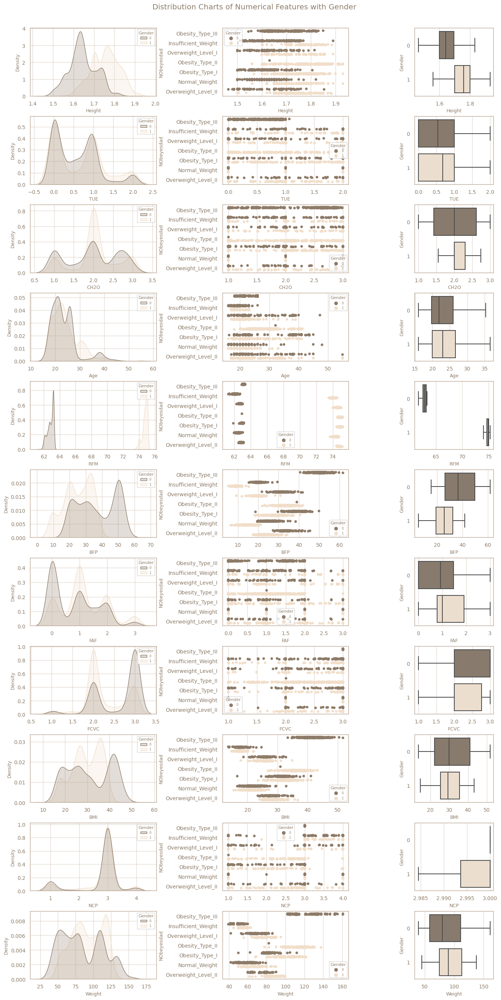

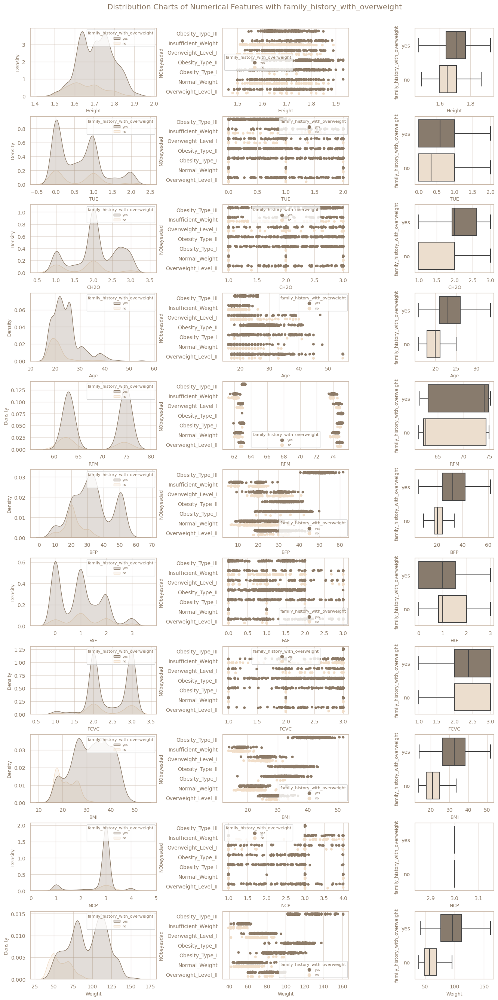

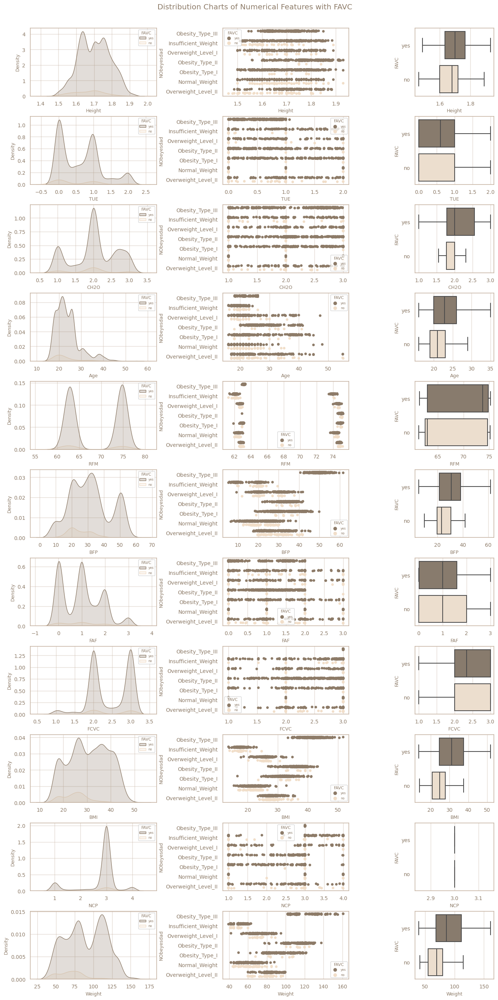

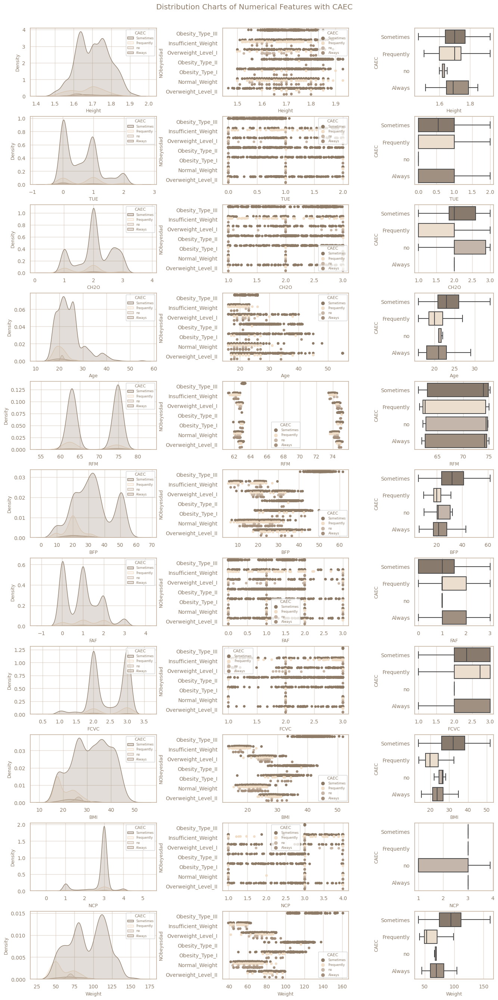

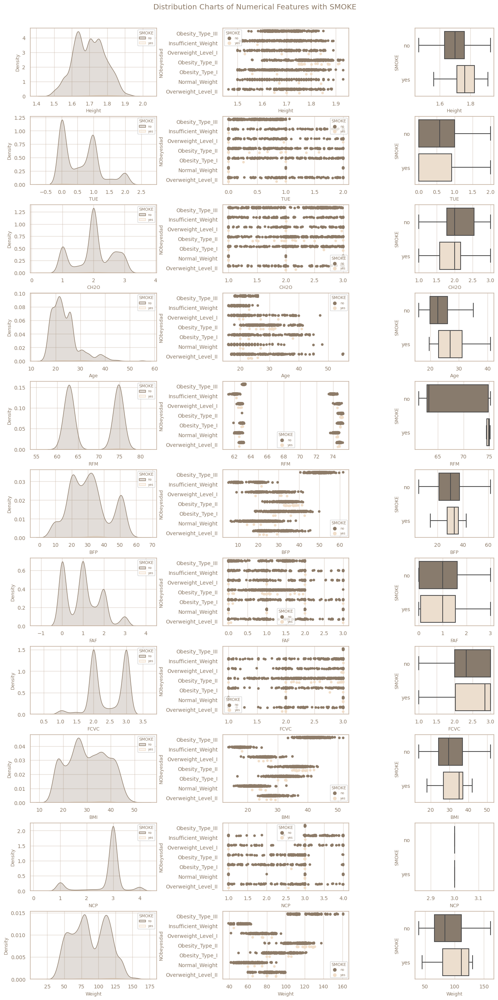

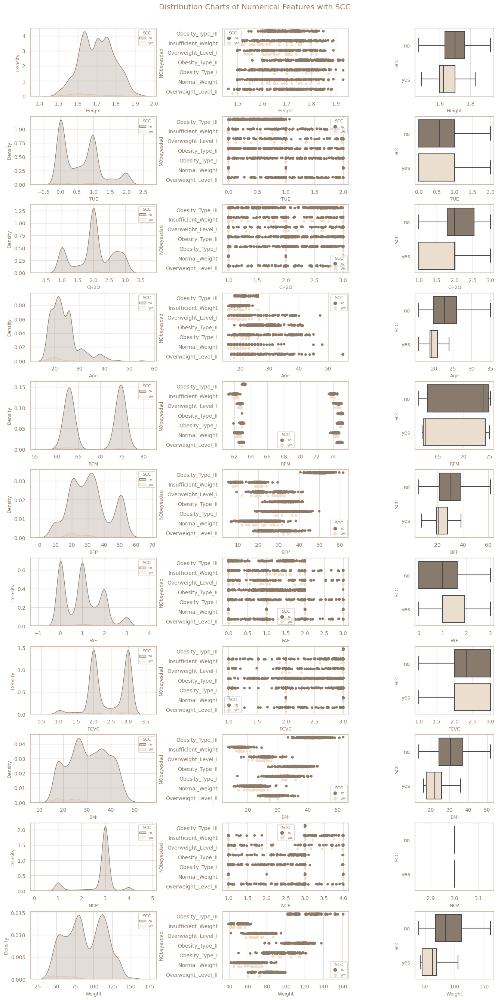

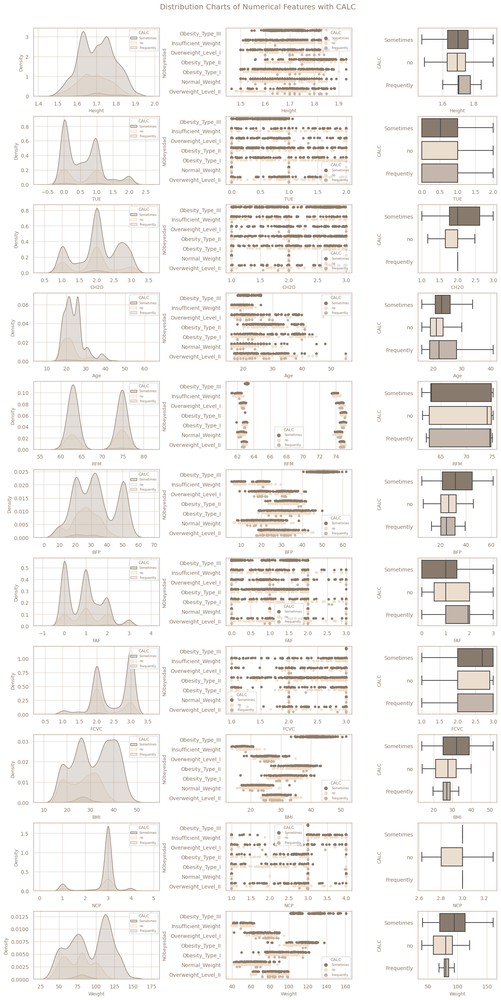

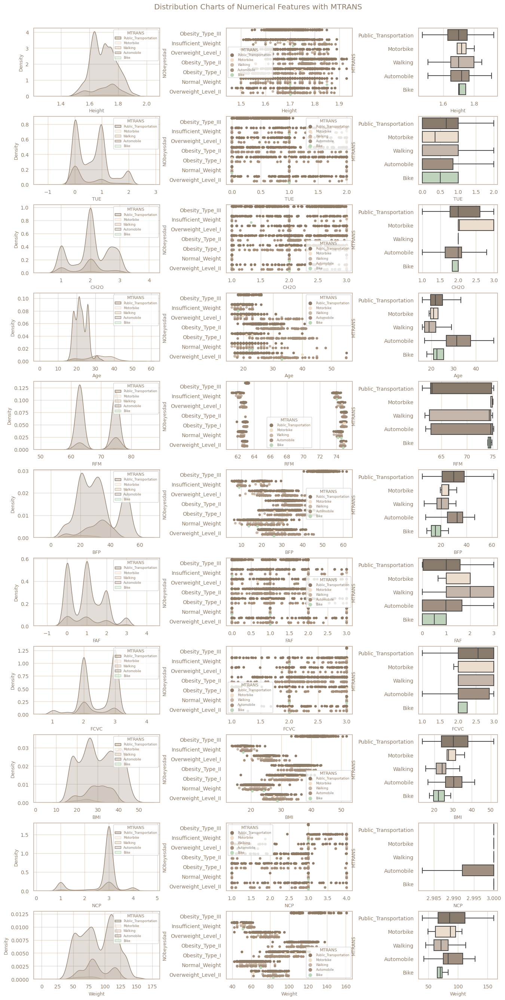

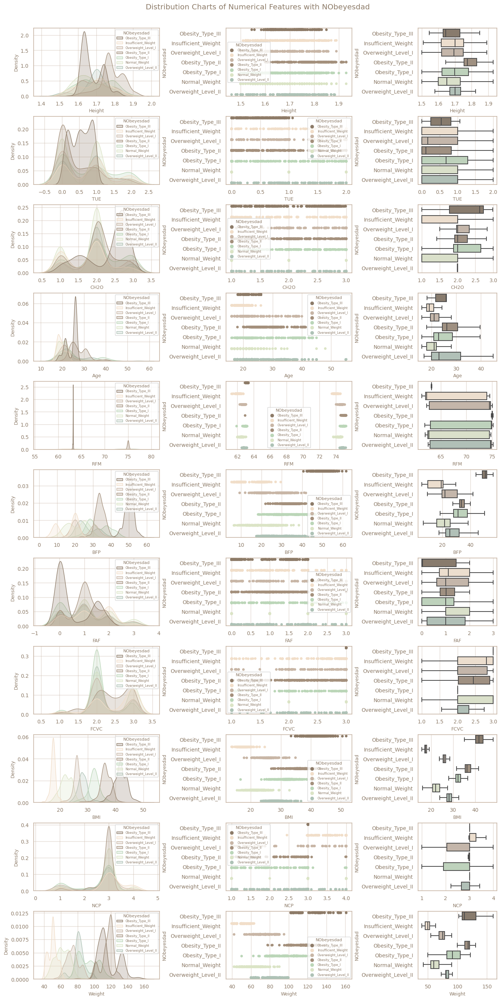

In [10]:
# Get categorical and numerical features
categorical,numeric = get_catnum(traindf)

# Remove feature from list
to_remove = ['id']
[numeric.remove(feature) for feature in to_remove if feature in to_remove]

# Get a sample of the dataframe 
sampled = traindf.sample(3000)
    
import matplotlib.pyplot as plt

# Iterate over categorical features and plot graphs
for i in categorical:
    distribution_view(sampled, numeric, i)


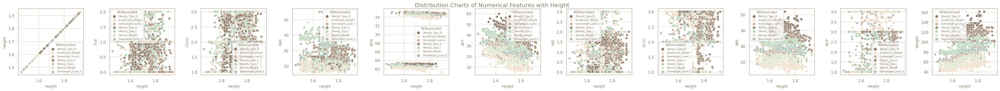

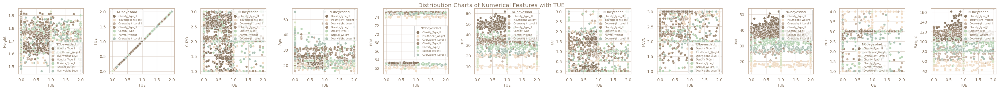

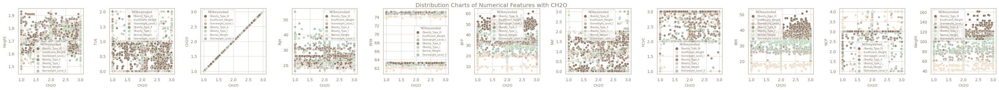

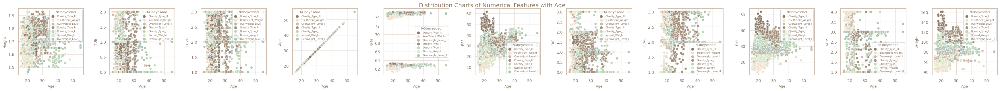

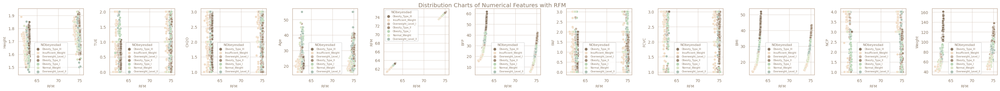

...

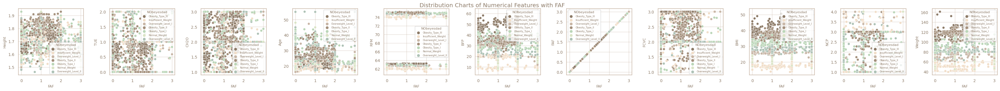

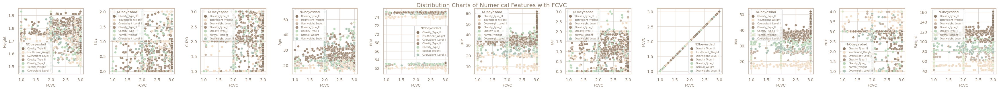

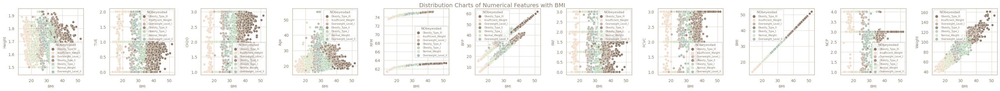

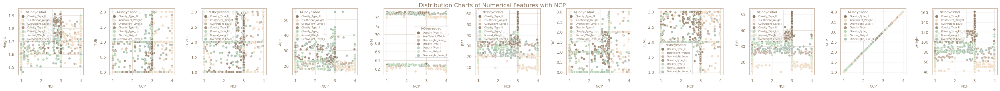

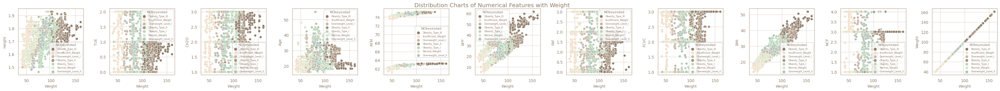

In [11]:
# Iterate over categorical features and plot graphs
for i in numeric:
    contiuos_view(sampled,numeric,i)
#for i in numeric[6:-1]:
    #contiuos_view(sampled,numeric[6:],i)

***

# <center><span style="color: dodgerblue"><a id = 6> Feature Selection
***

In [12]:
target = 'NObeyesdad'
features = list(traindf.columns)

to_remove = [target, 'id','SMOKE']
[features.remove(feature) for feature in to_remove if feature in to_remove]

encoder = LabelEncoder()
X = traindf[features]
y = pd.Series(encoder.fit_transform(traindf[target]),name = target)

cat, num = get_catnum(X)
cat = list(set(cat) - set(to_remove))
num = list(set(num) - set(to_remove))
print(f'categorical features : {cat}\nnumerical features : {num}')

display(X.head())
display(y.head().to_frame())

categorical features : ['MTRANS', 'CAEC', 'family_history_with_overweight', 'Gender', 'SCC', 'FAVC', 'CALC']
numerical features : ['Height', 'TUE', 'CH2O', 'RFM', 'BFP', 'FAF', 'FCVC', 'BMI', 'NCP', 'Weight', 'Age']


,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,CH2O,SCC,FAF,TUE,CALC,MTRANS,BMI,BFP,RFM
0,1,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,28.259565,23.333370,74.796869
1,0,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,2.000000,no,1.000000,1.000000,no,Automobile,23.422091,26.846509,62.667924
2,0,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,1.910378,no,0.866045,1.673584,no,Public_Transportation,17.126706,19.292047,62.001414
3,0,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,44.855798,53.246088,63.237231
4,1,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,25.599151,21.796430,74.504493


,NObeyesdad
0,6
1,1
2,0
3,4
4,6


# <center><span style="color: dodgerblue"><a id = 7> Pipeline
***

In [13]:
# Preprocessing for numerical data: scaling
numerical_transformer = Pipeline(steps=[
    ('scaler',MinMaxScaler())])

# Preprocessing for categorical data: one-hot encoding
categorical_transformer = Pipeline(steps = [
    ('encoder',OneHotEncoder(handle_unknown="ignore"))])

# Preprocessing compiler
preprocessor = ColumnTransformer(
    transformers = [
    ('numerical',numerical_transformer,num),
    ('categorical',categorical_transformer,cat)
])


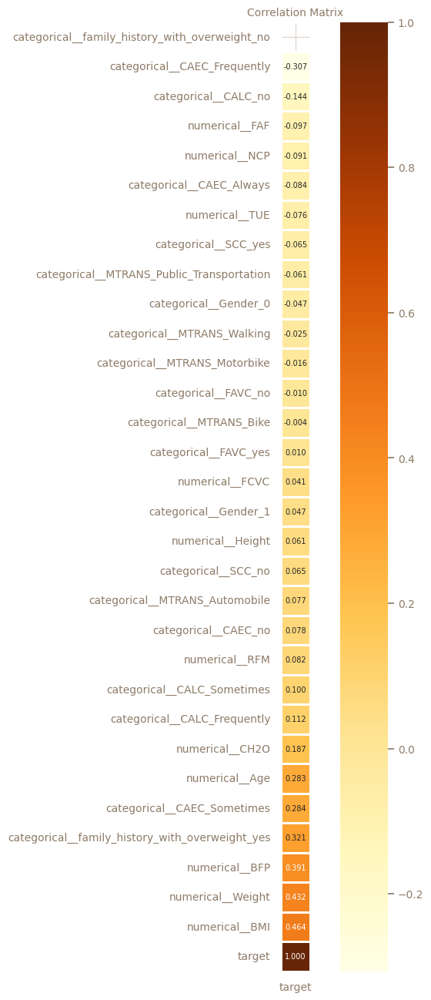

In [14]:
tranX = preprocessor.fit_transform(X)
if hasattr(preprocessor, 'get_feature_names_out'):
    feature_names = preprocessor.get_feature_names_out(X.columns)
    
tranX = pd.DataFrame(tranX,columns = feature_names)
tranX['target'] = y
corr = tranX.corr()['target'].sort_values().to_frame()

mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(10, 16))
sns.heatmap(corr, mask=mask, annot=True, cmap='YlOrBr', fmt='.3f', linewidths=1, square=True, annot_kws={"size": 7})
plt.title('Correlation Matrix', fontsize=10)
plt.show()

# <center><span style="color: dodgerblue"><a id = 8>Training Machine Models
***

In [15]:
# Split training data
Xtrain, Xtest, ytrain, ytest = train_test_split(X,y,test_size=.2,random_state=42)

# XGBClassifier Hyperparameters
XGB = XGBClassifier(**{'n_estimators': 246, 'max_depth': 3, 'min_samples_split': 10, 'min_samples_leaf': 5, 
                       'learning_rate': 0.3688172331168597, 'gamma': 0.07454964296322644, 'random_state': 42})

# LGBMClassifier Hyperparameters
LGBM = LGBMClassifier(**{'n_estimators': 384, 'max_depth': 9, 'min_child_samples': 20, 'num_leaves': 28, 
                         'learning_rate': 0.02305099844085421, 'subsample': 0.23321790403102516, 
                         'colsample_bytree': 0.4728996172493934, 'random_state':42, 'objective':'multiclass',
                        'num_class':7,'verbose':0})

# Create Pipelines
XGB_pipe = Pipeline(steps = [
    ('preprocessor',preprocessor),('model',XGB)])

LGBM_pipe = Pipeline(steps = [
    ('preprocessor',preprocessor),('model',LGBM)])


def fit(model,Xtrain, Ytrain, Xtest, Ytest):
    model.fit(Xtrain, Ytrain)
    predictions = model.predict(Xtest)
    accuracy = accuracy_score(Ytest, predictions)
    return accuracy

Classifiers = [XGB_pipe,LGBM_pipe]

[print(f'{type(pipe.named_steps["model"]).__name__} = {fit(pipe,Xtrain,ytrain,Xtest,ytest)}') for pipe in Classifiers]

XGBClassifier = 0.905587668593449
LGBMClassifier = 0.9072736030828517


[None, None]

In [16]:
'''
import optuna
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

def objective(trial):
    # Split the dataset
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

    # Define hyperparameters to optimize
    n_estimators = trial.suggest_int('n_estimators', 50, 600)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_child_samples = trial.suggest_int('min_child_samples', 20, 30)
    num_leaves = trial.suggest_int('num_leaves', 20, 30)
    learning_rate = trial.suggest_float('learning_rate', 0, 1)
    subsample = trial.suggest_float('subsample',0,1)
    colsample_bytree = trial.suggest_float('colsample_bytree',0,1)

    # Create and train the classifier with hyperparameters
    model = LGBMClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_child_samples=min_child_samples,
        num_leaves=num_leaves,
        learning_rate=learning_rate,
        random_state=42,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        objective='multiclass',
        num_class=7,
        verbose=0
    )
    
    model_pipe = Pipeline(steps = [
    ('preprocessor',preprocessor),('model',model)])
    
    model_pipe.fit(X_train, y_train)

    # Make predictions on the validation set
    y_pred = model_pipe.predict(X_valid)

    # Calculate accuracy for optimization
    accuracy = accuracy_score(y_valid, y_pred)
    return accuracy

    # Create an Optuna study and optimize
study = optuna.create_study(direction='maximize')  # maximize for accuracy
study.optimize(objective, n_trials=100)

    # Get the best hyperparameters
best_params = study.best_trial.params
print(f"Best Hyperparameters: {best_params}")

    # Train the final model with the best hyperparameters on the full dataset
final_model = LGBMClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    min_child_samples=best_params['min_child_samples'],
    num_leaves=best_params['num_leaves'],
    learning_rate=best_params['learning_rate'],
    subsample=best_params['subsample'],
    colsample_bytree=best_params['colsample_bytree'],
    objective='multiclass',
    num_class=7,
    verbose=0,
    random_state=42
)

final_pipe = Pipeline(steps = [
    ('preprocessor',preprocessor),('model',final_model)])
final_pipe.fit(X, y)
'''

'\nimport optuna\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.ensemble import RandomForestClassifier\nfrom sklearn.metrics import accuracy_score\n\ndef objective(trial):\n    # Split the dataset\n    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)\n\n    # Define hyperparameters to optimize\n    n_estimators = trial.suggest_int(\'n_estimators\', 50, 600)\n    max_depth = trial.suggest_int(\'max_depth\', 3, 10)\n    min_child_samples = trial.suggest_int(\'min_child_samples\', 20, 30)\n    num_leaves = trial.suggest_int(\'num_leaves\', 20, 30)\n    learning_rate = trial.suggest_float(\'learning_rate\', 0, 1)\n    subsample = trial.suggest_float(\'subsample\',0,1)\n    colsample_bytree = trial.suggest_float(\'colsample_bytree\',0,1)\n\n    # Create and train the classifier with hyperparameters\n    model = LGBMClassifier(\n        n_estimators=n_estimators,\n        max_depth=max_depth,\n        min_child_samples=min_child

import optuna
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

def objective(trial):
    # Split the dataset
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

    # Define hyperparameters to optimize
    n_estimators = trial.suggest_int('n_estimators', 50, 600)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5)
    learning_rate = trial.suggest_float('learning_rate', 0, 1)
    gamma = trial.suggest_float('gamma', 0, 1)

    # Create and train the classifier with hyperparameters
    model = XGBClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        learning_rate=learning_rate,
        gamma=gamma,
        random_state=42
    )
    
    model_pipe = Pipeline(steps = [
    ('preprocessor',preprocessor),('model',model)])
    
    model_pipe.fit(X_train, y_train)

    # Make predictions on the validation set
    y_pred = model_pipe.predict(X_valid)

    # Calculate accuracy for optimization
    accuracy = accuracy_score(y_valid, y_pred)
    return accuracy

    # Create an Optuna study and optimize
study = optuna.create_study(direction='maximize')  # maximize for accuracy
study.optimize(objective, n_trials=100)

    # Get the best hyperparameters
best_params = study.best_trial.params
print(f"Best Hyperparameters: {best_params}")

    # Train the final model with the best hyperparameters on the full dataset
final_model = XGBClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    learning_rate=best_params['learning_rate'],
    gamma=best_params['gamma'],
    random_state=42
)

final_pipe = Pipeline(steps = [
    ('preprocessor',preprocessor),('model',final_model)])
final_pipe.fit(X, y)

# <center><span style="color: dodgerblue"><a id = 10>Feature Importance
***

XGBClassifier
              precision    recall  f1-score   support

           0       0.94      0.93      0.94       524
           1       0.89      0.89      0.89       626
           2       0.88      0.87      0.87       543
           3       0.97      0.97      0.97       657
           4       1.00      1.00      1.00       804
           5       0.79      0.81      0.80       484
           6       0.81      0.81      0.81       514

    accuracy                           0.91      4152
   macro avg       0.90      0.90      0.90      4152
weighted avg       0.91      0.91      0.91      4152

LGBMClassifier
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       524
           1       0.88      0.89      0.89       626
           2       0.88      0.87      0.88       543
           3       0.97      0.98      0.98       657
           4       1.00      1.00      1.00       804
           5       0.79      0.80      0.79      

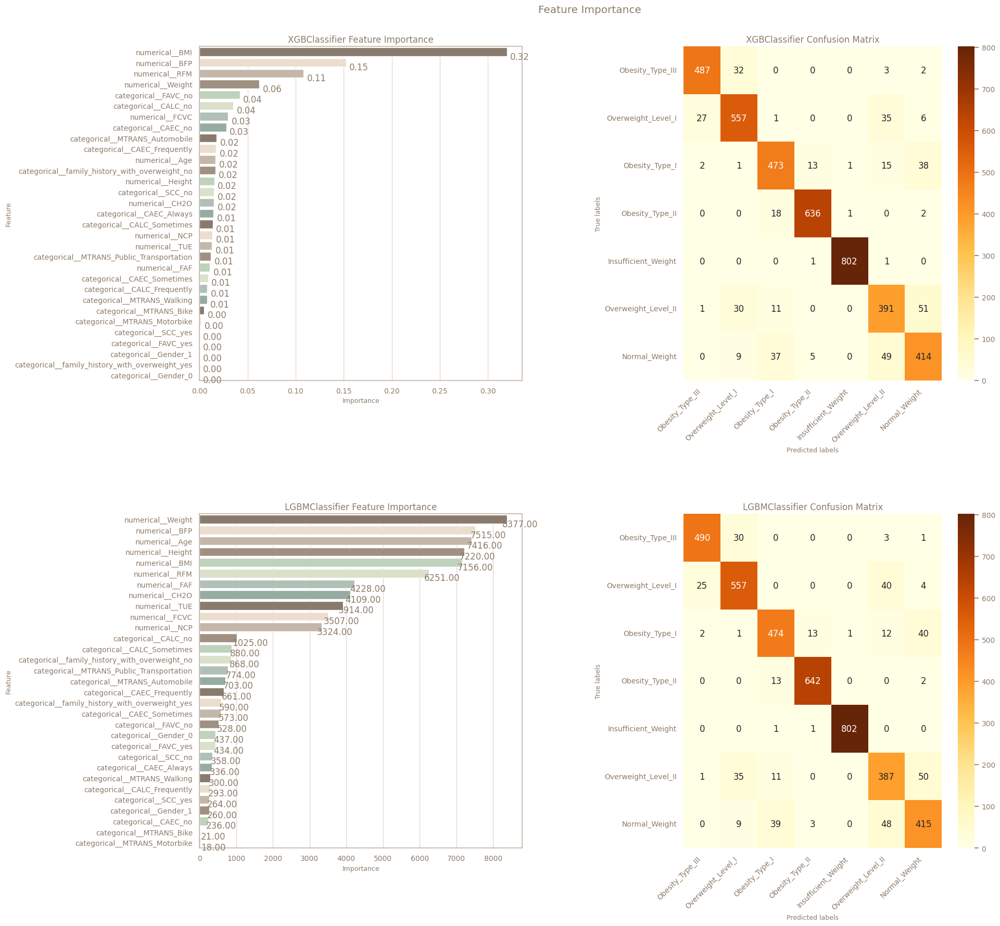

In [17]:
# List of Classifiers
models = [XGB_pipe,LGBM_pipe]

# Display feature importance
feature_importance(models, Xtrain, ytest,Xtest)

# <center><span style="color: dodgerblue"><a id = 10>Voting Classifier
***

In [18]:
# Create a VotingClassifier with the three XGBoost models
voting = VotingClassifier(estimators=[
    ('Model1', LGBM_pipe),
    ('Model3', XGB_pipe),
    #('Model4', CATB_pipe)
], voting='soft', weights = [0.6,0.4])

voting.fit(Xtrain, ytrain)

predict = voting.predict(Xtest)

acuu = accuracy_score(ytest, predict) 
acuu

0.9077552986512524

In [19]:
voting.fit(X,y)

VotingClassifier(estimators=[('Model1',
                              Pipeline(steps=[('preprocessor',
                                               ColumnTransformer(transformers=[('numerical',
                                                                                Pipeline(steps=[('scaler',
                                                                                                 MinMaxScaler())]),
                                                                                ['Height',
                                                                                 'TUE',
                                                                                 'CH2O',
                                                                                 'RFM',
                                                                                 'BFP',
                                                                                 'FAF',
                                                                                 'FCVC',
                                                                                 'BMI',
                                                                                 'NCP',
                                                                                 'Weight',
                                                                                 'Age']),
                                                                               ('categorical',
                                                                                Pipeline(steps=[('encoder',
                                                                                                 OneHotEncoder(handle_unknown='ignore'))]),
                                                                                ['MTRANS',
                                                                                 'CAEC',
                                                                                 'family_hist...
                                                             interaction_constraints=None,
                                                             learning_rate=0.3688172331168597,
                                                             max_bin=None,
                                                             max_cat_threshold=None,
                                                             max_cat_to_onehot=None,
                                                             max_delta_step=None,
                                                             max_depth=3,
                                                             max_leaves=None,
                                                             min_child_weight=None,
                                                             min_samples_leaf=5,
                                                             min_samples_split=10,
                                                             missing=nan,
                                                             monotone_constraints=None,
                                                             multi_strategy=None,
                                                             n_estimators=246,
                                                             n_jobs=None, ...))]))],
                 voting='soft', weights=[0.6, 0.4])

# <center><span style="color: dodgerblue"><a id = 11>Submission
***

In [20]:
pred = voting.predict(testdf[features])
output = pd.DataFrame()
output['id'] = testdf.id
output[target] = pred
output[target] = encoder.inverse_transform(output[target])
output.to_csv('submission.csv', index = False)
print("Your submission was successfully saved!")
output.head()

Your submission was successfully saved!


,id,NObeyesdad
0,20758,Obesity_Type_II
1,20759,Overweight_Level_I
2,20760,Obesity_Type_III
3,20761,Obesity_Type_I
4,20762,Obesity_Type_III
